#Prerequisites

- Google Account (to run this Colab notebook): https://s.whylabs.io/toloka_whylabs_colab
- Free Toloka account (Promo code: `DRIFT_2022`): https://toloka.ai/get-started
- Free WhyLabs account: https://whylabs.ai/free




##Toloka

Sign-up for a free Toloka [account](https://toloka.ai/get-started) as a requester.

Apply "DRIFT_2022' promo code in [Profile tab](https://platform.toloka.ai/requester/profile) once registered. You will to get 30$ of free data labelling credit.

![picture](https://docs.google.com/uc?id=109JZwLCtOLp55TPLIyB5nfAJxJS05tyc)



##WhyLabs

Sign-up free a free WhyLabs account (https://whylabs.ai/free)

![](https://github.com/sagecodes/workshop-images/blob/master/monitor_preview.png?raw=true)

#Detect and Fix Data Drift for Computer Vision with Toloka and WhyLabs

![picture](https://docs.google.com/uc?id=1R9E8ZBQkved7cE7lV4oy-9y3tgZC2xX1)


# Intro

##Speakers / Authors

![picture](https://docs.google.com/uc?id=1nEWgrWRY0aPJ7yYNVnSiGqAeXgl9zgC4)


##(Sage) Introducing topic

- Data Drift Happens

![](https://whylabs.ai/_next/image?url=https%3A%2F%2Fcontent.whylabs.ai%2Fcontent%2Fimages%2F2022%2F09%2Fcontrast_cat.png&w=2048&q=75)

##(Magda) Problem statement - cats versus dogs

For the purposes of this webinar, we will focus on the well-known cat versus dog classification problem.

We will monitor a model that was designed to recognize if the picture shown to it shows a cat or a dog.

![picture](https://docs.google.com/uc?id=1QdbWXg61_ncXHHyL-m33yIv4S8xdKOqt)

Make a note that the same logic that we will show in this tutorial can be applied to any other photo classification task.


#Imports

We need to import toloka-kit, crowd-kit, and whylogs. These three tools/libraries will be used throughout the tutorial.

In [ ]:
!pip install toloka-kit[pandas]==1.0.0 crowd-kit==1.0.0 Pillow==9.2.0 whylogs[whylabs,image]==1.1.1 nest_asyncio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


We will need to download photos of cats and dogs that we will be classifying. They are already hosted on the cloud. Let's save them in /tmp/toloka-whylabs.

In [ ]:
!wget --no-check-certificate \
    "https://tolokacommunity.blob.core.windows.net/toloka-whylabs/whylabs-toloka-images.zip" \
    -O "/tmp/whylabs-toloka-images.zip"
!unzip "/tmp/whylabs-toloka-images.zip" -d "/tmp/toloka-whylabs/"
!ls "/tmp/toloka-whylabs"

We also need to download a pretarined cat-verus-dog 
classification model, which we also hosted in a cloud 
previously.


In [ ]:
!wget --no-check-certificate "https://tolokacommunity.blob.core.windows.net/toloka-whylabs/cats_dogs_model.h5" -O "/tmp/toloka-whylabs/cats_dogs_model.h5"

And, last but not least, we should douwnload Toloka Project config file

In [ ]:
!wget --no-check-certificate "https://tolokacommunity.blob.core.windows.net/toloka-whylabs/toloka_project_config.json" -O "/tmp/toloka-whylabs/toloka_project_config.json"

In [ ]:
!ls /tmp/toloka-whylabs/day1/

# Part 1: sending data to WhyLabs

(Sage) Intro to whylogs and Whylabs: data logging, data profiles

# Create profiles with whylogs

https://github.com/whylabs/whylogs

whylogs is an open source library for logging any kind of data. With whylogs, users are able to generate summaries of their datasets (called whylogs profiles) which they can use to:

- Track changes in their dataset
- Create data constraints to know whether their data looks the way it should
- Quickly visualize key summary statistics about their datasets


![](https://user-images.githubusercontent.com/7946482/171062942-01c420f2-7768-4b7c-88b5-e3f291e1b7d8.png)

profiles generated with whylogs are:
- Efficient
- Customizable
- Mergeable

```
import whylogs as why
from whylogs import WhyLabsWriter()

dataset = '...'

writer = WhyLabsWriter()
profile= why.log(dataset)
writer.write(file=profile.view())
```


In [ ]:
import datetime
import getpass
import os
import time

from PIL import Image
from whylogs.extras.image_metric import log_image
from whylogs.api.writer.whylabs import WhyLabsWriter

https://whylabs.ai/free

Project / Model ID`Create Project -> Set up model`

API Token & Org `Menu -> Settings -> Access Tokens`

In [ ]:
# Make sure no spaces are in your string
os.environ['WHYLABS_API_KEY'] = 'YOURTOKEN'
os.environ["WHYLABS_DEFAULT_ORG_ID"] = 'YOURORG'
os.environ["WHYLABS_DEFAULT_DATASET_ID"] = 'MODELID'

In [ ]:
writer = WhyLabsWriter()
for day in range(1,8):
    date = datetime.datetime.now(datetime.timezone.utc) + datetime.timedelta(days=-7+day)
    print(f'Working with day {date}')
    for filename in os.listdir(f'/tmp/toloka-whylabs/day{day}'):
        if filename.endswith('.jpg') or filename.endswith('.jpeg'):
            image_filepath = os.path.join(f'/tmp/toloka-whylabs/day{day}', filename)
            image = Image.open(image_filepath)
            profile = log_image(image).profile()
            profile.set_dataset_timestamp(date)
            writer.write(profile)

![](https://github.com/sagecodes/workshop-images/blob/master/monitor_preview.png?raw=true)

# Part 2: model predictions

In [ ]:
import numpy as np
import pandas as pd

from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model

Let's load a pretarined model. It is just a simple CNN trained using Keras.

In [ ]:
# load model
model = load_model('/tmp/toloka-whylabs/cats_dogs_model.h5')
# summarize model.
model.summary()


def preprocess_image(img_url):
    img = Image.open(img_url)
    img = img.convert('RGB')
    img = img.resize((150, 150), Image.NEAREST)
    img_array = image.img_to_array(img)
    img_batch = np.expand_dims(img_array, axis=0)
    img_batch = img_batch/255.0
    return img_batch

Our imgaes are hosted in the cload and we have csv files that organize them. Let's create dataframes from csv files.

In [ ]:
dfs_list = [pd.read_csv(f'/tmp/toloka-whylabs/day{day}.csv') for day in range(1, 8)]

In [ ]:
dfs_list[0]

In [ ]:
for i in range(len(dfs_list)):
    dfs_list[i]['image'] = dfs_list[i].url.str.split('/').str[-1]

In [ ]:
dfs_list[0]

Now, let's download each image hosted in the cloud to current notebook and apply our classification model. 

In [ ]:
for i in range(len(dfs_list)):
    dfs_list[i]['model_score'] = dfs_list[i].apply(lambda row: model.predict(preprocess_image(os.path.join(f'/tmp/toloka-whylabs/day{i+1}', row.image)))[0,0], axis=1)
    dfs_list[i]['model_predictions']  = dfs_list[i].apply(lambda row: np.round(row.model_score), axis=1)
    dfs_list[i]['model_predictions'] = dfs_list[i]['model_predictions'].map({0: 'cat', 1: 'dog'})

Now that we have completed it for all days let's have a look at the results for day 1 of our experiemnt.

In [ ]:
dfs_list[0]

It is intresting to see a few images that we did predictions for.

Let's have a look at first image from day 1.

In [ ]:
from IPython.display import Image
Image('/tmp/toloka-whylabs/day1/' + dfs_list[0].iloc[0].image, width=300)

And the second one:

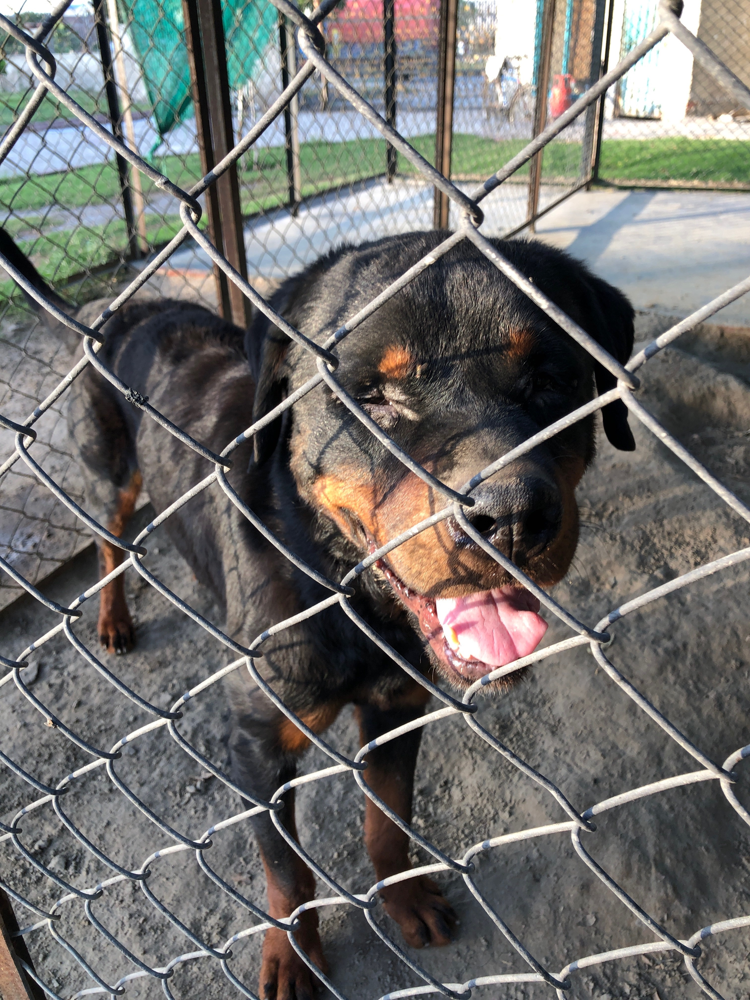

In [ ]:
from IPython.display import Image
Image('/tmp/toloka-whylabs/day1/' + dfs_list[0].iloc[1].image, width=300)

And the third one:

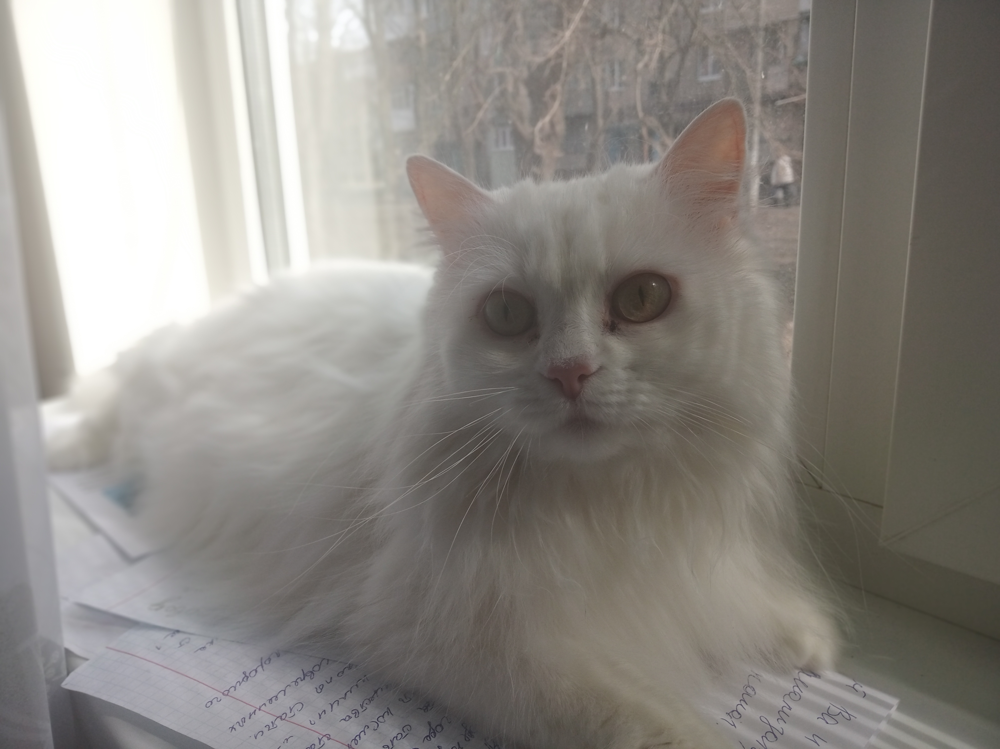

In [ ]:
from IPython.display import Image
Image('/tmp/toloka-whylabs/day1/' + dfs_list[0].iloc[2].image, width=300)

# Part 3: Get ground truth via Toloka

##(Magda) Intro to Crowdsourcing and Toloka

Toloka is a crowdsourcing platform that connects requesters to a global crowd. It can be used for gathering or labeling data.

![picture](https://docs.google.com/uc?id=1JxXy4iofJlazqXl24xOu8ynq8Zcnadhh)


The crowd is distributed in all over the world.

![picture](https://docs.google.com/uc?id=1wrt40-u6qr-89JLphbSHiNS2vva7AyFf)



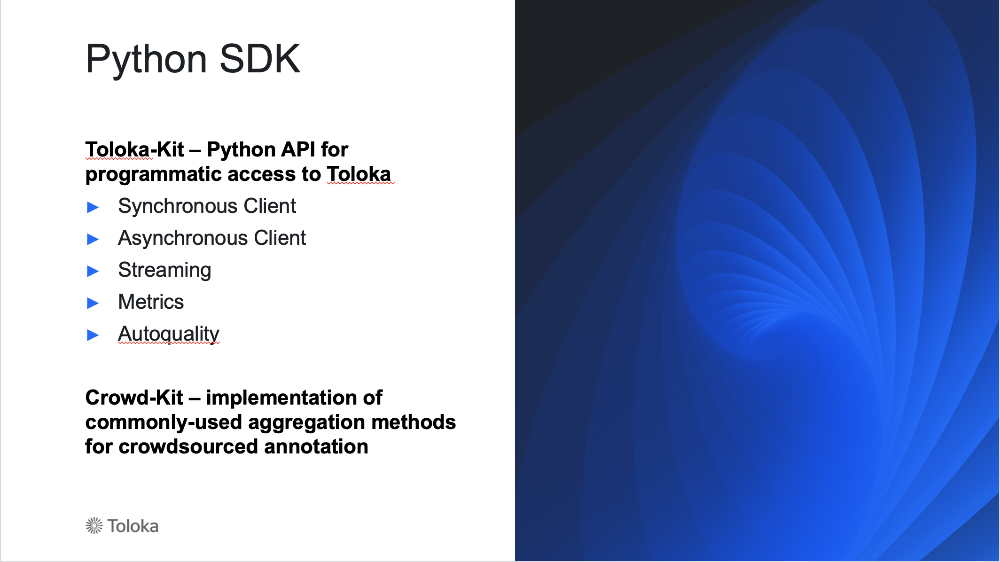

We are going to use [Toloka-Kit](https://github.com/Toloka/toloka-kit) to communicate with Toloka platform programmtically.

## Configure Toloka

You will need to load toloka module, create Toloka client and pass the authentication token. 

You can get authentication token from [Profile / Integration](https://platform.toloka.ai/requester/profile/integration) tab in Toloka webiste.

![picture](https://docs.google.com/uc?id=1p1xngm-6RnCjx2gqNeFRtXmn-JjlIimd)


In [ ]:
import toloka.client as toloka
import toloka.async_client as async_toloka
from getpass import getpass

toloka_token = getpass("Enter your token:")
toloka_client = toloka.TolokaClient(toloka_token, 'PRODUCTION') 
async_toloka_client = async_toloka.AsyncTolokaClient(toloka_token, 'PRODUCTION')

##(Magda) Create a project in Web Interface.

1. We need to fill general project settings

![picture](https://docs.google.com/uc?id=1iNbQUG-LiHNWNNiPnWy6PmSEqPCnobpn)


2. We need to create interface

![picture](https://docs.google.com/uc?id=1aaXrPg5Gq9nnUaydIzb-E15VTj9_r-H1)


3. We need to provide instructions for labellers

![picture](https://docs.google.com/uc?id=1qZnnQFXipZ_pmwnP22XcX0mRAteHH8ru)





(Dan) Create a project from json config using Toloka-Kit 

## Create a new project template with Toloka

In [ ]:
with open('/tmp/toloka-whylabs/toloka_project_config.json') as project_config_file:
    json_string = project_config_file.read()
new_project = toloka.Project.from_json(json_string)
new_project = toloka_client.create_project(new_project)

## Create a pool with Toloka - who will be preforming our tasks?

This is a place where we will set up details about filtering the peformers, quality control rules, page pricing, etc.

![picture](https://docs.google.com/uc?id=1MnnEN7Ei-anye0tpNhYMT4SN5OUb8jIR)

(Magda) Quality control

There are different ways of controlling quality of the data labelling process and let's have a look at some common ones:

 	 	 
CAPTCHAs
![picture](https://docs.google.com/uc?id=1VxbXnKEa9040IB6U4BtFXildrj4FNRcU)


Fast responses
![picture](https://docs.google.com/uc?id=1SnLyeMAYiA8AIofxpxEdV8HszZkPxO0a)


Control tasks

![picture](https://docs.google.com/uc?id=1f83JiS5gNOg44RV9vpJYsYXkMK432b7V)


(Dan) Quality control features we use, create pool

In [ ]:
def prepare_pool(project_id, pool_name):
    new_pool = toloka.Pool(
      project_id=project_id,
      private_name=pool_name,  # Only you can see this information
      may_contain_adult_content=False,
      reward_per_assignment=0.01,  # Sets the minimum payment amount for one task suite in USD
      assignment_max_duration_seconds=60*2,  # Gives performers 5 minutes to complete one task suite
      will_expire=datetime.datetime.utcnow() + datetime.timedelta(days=365),  # Sets that the pool will close after one year
    )

    new_pool.defaults = toloka.pool.Pool.Defaults(
      default_overlap_for_new_tasks=3,
      default_overlap_for_new_task_suites=0,
    )

    new_pool.set_mixer_config(
      real_tasks_count=10,  # The number of tasks per page.
    )

    new_pool.filter = toloka.filter.Languages.in_('EN')

    # Turns on captchas
    new_pool.set_captcha_frequency('MEDIUM')
    # Bans performers by captcha criteria
    new_pool.quality_control.add_action(
      # Type of quality control rule
      collector=toloka.collectors.Captcha(history_size=5),
      # This condition triggers the action below
      # Here overridden comparison operator actually returns a Condition object
      conditions=[toloka.conditions.FailRate > 20],
      # What exactly should the rule do when the condition is met
      # It bans the performer for 1 day
      action=toloka.actions.RestrictionV2(
          scope='PROJECT',
          duration=1,
          duration_unit='DAYS',
          private_comment='Captcha',
      )
    )
    return new_pool

In [ ]:
pools = [None] * len(dfs_list)
pool_tasks = [None] * len(dfs_list)

In [ ]:
for i in range(len(dfs_list)):
    pools[i] = toloka_client.create_pool(prepare_pool(new_project.id, f'day {i+1} pool'))
    pool_tasks[i] = [toloka.Task(input_values={'image': url}, pool_id=pools[i].id) for url in dfs_list[i].url]
    toloka_client.create_tasks(pool_tasks[i], allow_defaults=True)
    print(f'Populated pool with {len(pool_tasks[i])} tasks')
    print(f'To view this pool, go to https://platform.toloka.ai/requester/project/{new_project.id}/pool/{pools[i].id}')

In [ ]:
async def wait_pool_for_close(pool_id, minutes_to_wait=1):
    sleep_time = 10 * minutes_to_wait
    pool = await async_toloka_client.get_pool(pool_id)
    if pool.is_closed():
        pool = await async_toloka_client.open_pool(pool.id)
    while not pool.is_closed():
        op = await async_toloka_client.get_analytics([toloka.analytics_request.CompletionPercentagePoolAnalytics(subject_id=pool.id)])
        op = await async_toloka_client.wait_operation(op)
        percentage = op.details['value'][0]['result']['value']
        print(
            f'   {datetime.datetime.now().strftime("%H:%M:%S")}\t'
            f'Pool {pool.id} - {percentage}%'
        )
        time.sleep(sleep_time)
        pool = await async_toloka_client.get_pool(pool.id)
    print('Pool was closed.')

In [ ]:
import nest_asyncio
import asyncio

nest_asyncio.apply()

await asyncio.gather(*[wait_pool_for_close(pool.id) for pool in pools])

## Answers aggregation

*While data is being labelled* (Magda) Intro to aggregation

In crowdsourcing, we usually ask more than one person to perform the same task to be more confident about the final label. This is callled ovrelap. Therefore once we gather the answers we need to aggregate the results from all annotators. The simplest way to do it for classification tasks is the majority vote rule.
 
![picture](https://docs.google.com/uc?id=1KBGrYhImhemempE8q93sKSnhoy_umDDc)
 
A slightly more complex algorithm to solve the same problem is called Dawid-Skene algorithm and usually could give us better results.
 
![picture](https://docs.google.com/uc?id=1leuCSxPzl2y60IgBANMOibXKlOqdlcVg)


(Dan) Details about aggregation, Crowd-Kit

*When we have data labelled*

(Dan) Go through the code we use to aggregate solutions

We suggest you use [Crowd-Kit](https://github.com/Toloka/crowd-kit) to aggregate labelled data you get from Toloka

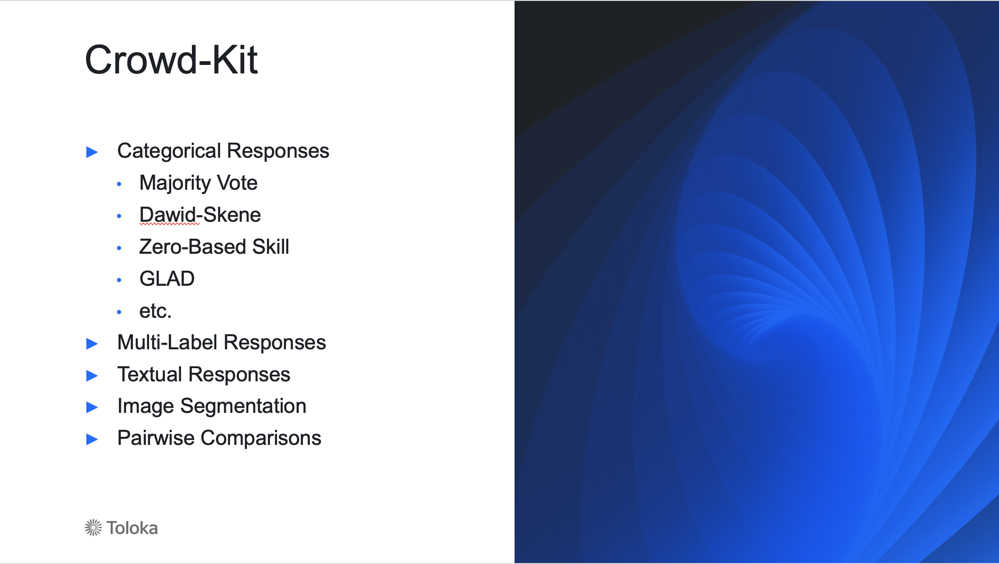

In [ ]:
from crowdkit.aggregation import MajorityVote

In [ ]:
def get_hitl_predictions(pool_id):
    answers_df = toloka_client.get_assignments_df(pool_id)

    # Prepare dataframe for aggregation
    answers_df = answers_df.rename(columns={
        'INPUT:image': 'task',
        'OUTPUT:result': 'label',
        'ASSIGNMENT:worker_id': 'worker',
    })
    predicted_answers = MajorityVote().fit_predict(answers_df)
    
    predicted_answers = predicted_answers.to_frame().reset_index().rename(columns={
        'task': 'url',
        'agg_label': 'hitl_predictions',
    })
    predicted_answers['image'] = predicted_answers.url.str.split('/').str[-1]
    
    return predicted_answers

In [ ]:
for i in range(len(dfs_list)):
    hitl_predictions = get_hitl_predictions(pools[i].id)
    dfs_list[i] = dfs_list[i].merge(hitl_predictions, on=['url', 'image'])

In [ ]:
dfs_list[0]

In [ ]:
dfs_list[5]

# Part 4: Analyse metrics on Whylabs

(Sage) Metrics analysis on Whylabs

(Dan) Explain our solution

In [ ]:
from whylogs import log_classification_metrics
for i in range(len(dfs_list)):
    day = i+1
    date = datetime.datetime.now(datetime.timezone.utc) + datetime.timedelta(days=-7+day)
    print(f'Sending metrics for day {date} to Whylabs')
    results = log_classification_metrics(
        dfs_list[i],
        target_column = "hitl_predictions",
        prediction_column = "model_predictions",
        score_column="model_score"
    )

    profile = results.profile()
    profile.set_dataset_timestamp(date)

    print("writing profiles to whylabs...")
    results.writer("whylabs").write()

![](https://github.com/sagecodes/workshop-images/blob/master/model_performance1.png?raw=true)

![](https://github.com/sagecodes/workshop-images/blob/master/model_performance2.png?raw=true)


#Conclusion
 
In this workshop, you have learned how to detect and fix data drift on the example of a simple classification project.

And if you enjoyed it why not share this notebook with other colleagues who may be interested?

Drift is a real phenomenon and it will happen sooner or later to any ML model. It is your responsibility to keep your models healthy and up-to-date. If you are not sure how to apply drift monitoring to your own model, talk to us directly: [Dan](https://www.linkedin.com/in/daniil-fedulov-17949479/), [Magda](https://www.linkedin.com/in/magdalena-konkiewicz-644678125/), [Sage](https://www.linkedin.com/in/sageelliott/).

To learn more WhyLabs or get support, join [WhyLabs + Robust & Responsible AI community Slack](https://bit.ly/rsqrd-slack)

To learn more about building end-to-end ML solutions using a human-in-the-loop approach join [Toloka Global Slack community](https://tolokacommunity.slack.com)




#Links

[Toloka](https://www.toloka.ai) and [Toloka Documentation](https://toloka.ai/en/docs/)

[Toloka Open Source on GitHub](https://github.com/Toloka)

[Toloka-Kit](https://github.com/Toloka/toloka-kit) and [Toloka-Kit Docs](https://toloka.ai/en/docs/toloka-kit/)

[Crowd-Kit](https://github.com/Toloka/crowd-kit) and [Crowd-Kit Docs](https://toloka.ai/en/docs/crowd-kit/)

whylogs github: https://github.com/whylabs/whylogs/

WhyLabs free sign-up: https://whylabs.ai/free

Slack channel: https://bit.ly/r2ai-slack